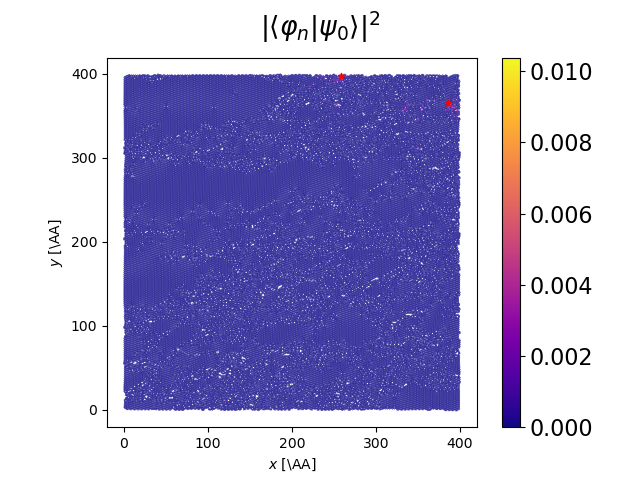

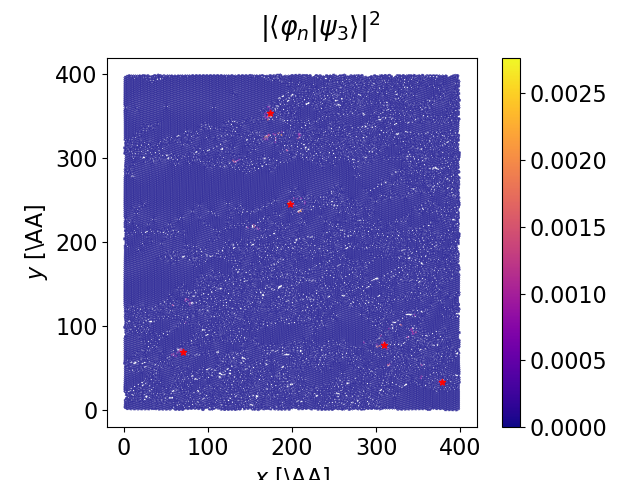

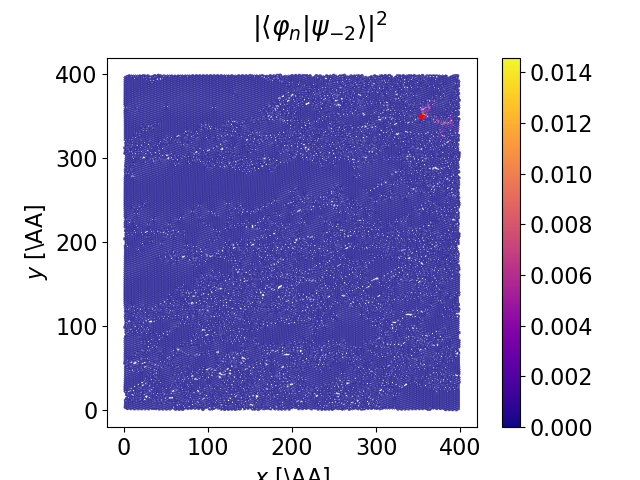

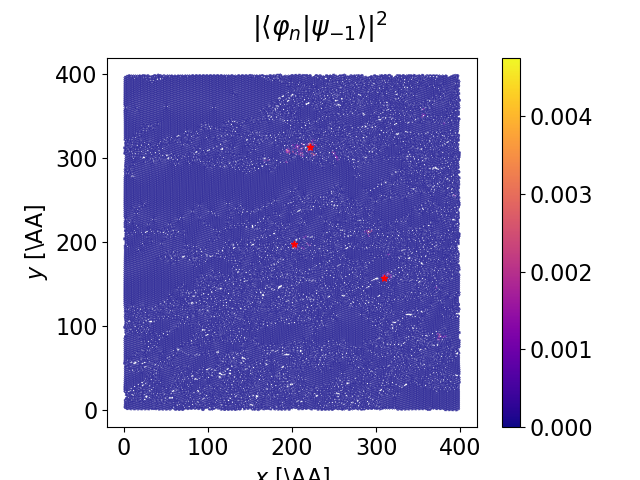

In [1]:
%matplotlib widget

import numpy as np
import matplotlib.pyplot as plt
from qcnico.qcplots import plot_atoms, plot_MO
from qcnico.coords_io import read_xsf
from MOs2sites import get_MO_loc_centers_opt, clean_centers

nsample = 127

percdir = f'/Users/nico/Desktop/simulation_outputs/percolation/Ata_structures/tempdot6/percolate_output/zero_field/virt_100x100_gridMOs/sample-{nsample}/'
Mdir = '/Users/nico/Desktop/simulation_outputs/percolation/Ata_structures/tempdot6/MOs_ARPACK/virtual/'
posdir = '/Users/nico/Desktop/simulation_outputs/MAC_structures/Ata_structures/tempdot6/relaxed/'

MO_inds = [0,3,-2,-1]

# cc = np.load(percdir + 'cc.npy')
# ii = np.load(percdir + 'ii.npy')
M = np.load(Mdir + f'MOs_ARPACK_bigMAC-{nsample}.npy') 
pos,_ = read_xsf(posdir + f'tempdot6n{nsample}_relaxed.xsf')

avg_psis = np.mean(M**2,axis=0)
std_psis = np.std(M**2,axis=0)
thresholds = avg_psis + 10*std_psis

Mcut = np.copy(M)
for n in range(M.shape[1]):
    psi = M[:,n]**2
    Mcut[psi < thresholds[n],n] = 0

# MO_inds = np.unique(ii)[MO_inds]
# print(MO_inds)

for n in MO_inds:
    # site_inds = (ii == n).nonzero()[0]
    # print(site_inds)
    # sites = cc[site_inds]
    sites, rho, xedges, yedges = get_MO_loc_centers_opt(pos, M, n, nbins=100,threshold_ratio=0.5, shift_centers=False,min_distance=30)
    # sites2 = clean_centers(sites,peak_inds,rho)
    
    fig,ax = plt.subplots()

    fig, ax = plot_MO(pos,Mcut,n,dotsize=0.1,show=False,plt_objs=(fig,ax),usetex=False)
    ax.scatter(sites[:,0],sites[:,1],marker='*',color='r',s=20)
    # ax.scatter(sites2[:,0],sites2[:,1],marker='o',edgecolors='r',facecolors='none',s=100)
    plt.show()


In [ ]:
from qcnico.plt_utils import histogram, get_cm

nbins = 200

for n in MO_inds:
    psi = np.abs(M[:,n])**2
    _, bins = np.histogram(psi, bins=nbins)
    centers = 0.5 * (bins[:-1] + bins[1:])
    clrs = get_cm(centers,'plasma')
    fig, ax = plt.subplots() 
    fig, ax = histogram(psi,nbins=nbins,plt_objs=(fig,ax),usetex=False,log_counts=True,show=False,plt_kwargs={'color':clrs})
    ax.axvline(x=np.mean(psi),ymin=0,ymax=1,c='k',lw=0.8,ls='--')
    ax.axvline(x=np.mean(psi)+np.std(psi),ymin=0,ymax=1,c='k',lw=0.8,ls='--')
    ax.axvline(x=np.mean(psi)+2*np.std(psi),ymin=0,ymax=1,c='k',lw=0.8,ls='--')
    ax.axvline(x=np.mean(psi)+10*np.std(psi),ymin=0,ymax=1,c='k',lw=0.8,ls='--')
    plt.legend()
    plt.show()

3
4
8
16
17
18
20
21
22
25
26
27
28
35
37
38
40
43
45
46
48
49
51
53
56
57
58
61
66
67
71
72
73
76
83
88
91
92
95
97
100
105
108
109
111
113
117
118
119
121
125
126
129
131
133
134
135
137
138
140
142
144
148
149
150
152
153
158
164
166
167
170
171
172
173
175
177
178
180
181
182
184
185
190
193
194
196
197
200
202
204
205
206
208
209
210
213
217
219
221
226
228
231
232
236
240
242
245
248
249
250
252
254
255
256
257
258
259
261
263
267
268
271
272
274
275
277
281
282
283
287
288
290
291
292
294
295
296
297
299
308
312
313
316
321
323
326
328
329
332
333
335
336
338
339
342
344
345
346
347
348
349
351
352
353
356
359
360
362
363
365
368
369
372
nclusts =  3
cc_clrs =  ['#1f77b4', '#ff7f0e', '#2ca02c']
cluster_clrs =  ['#1f77b4', '#ff7f0e', '#2ca02c']


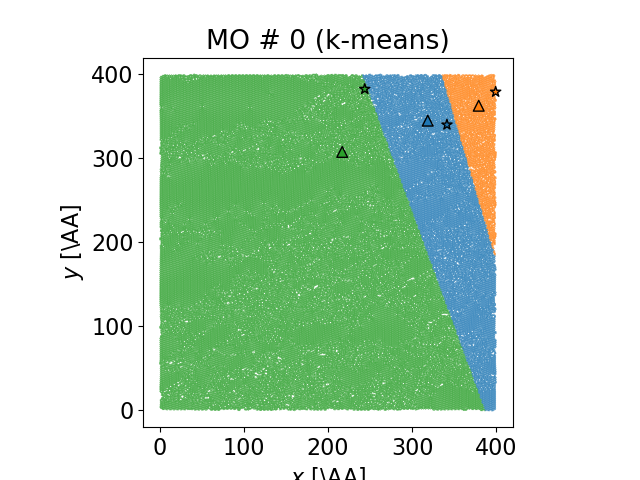

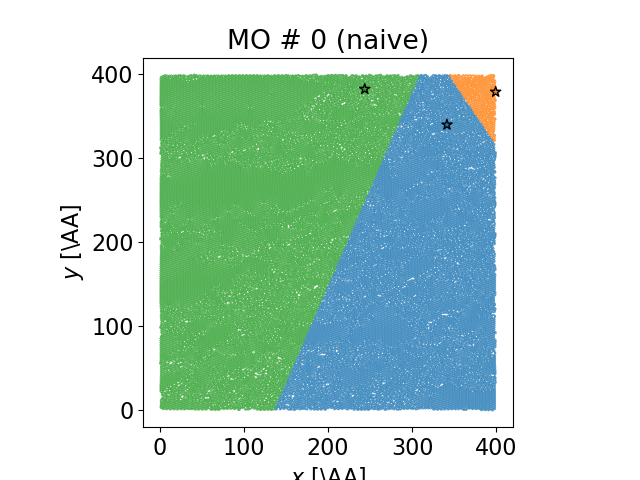

Min inter-site distance =  69.89815793794254
Min inter-cc distance =  63.208825084776606


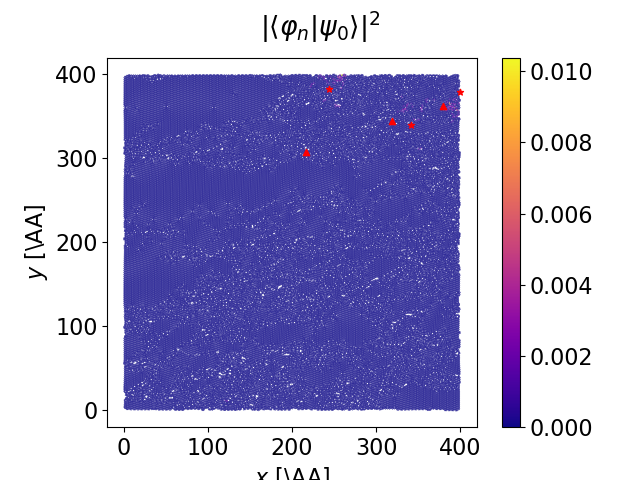

nclusts =  8
cc_clrs =  ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']
cluster_clrs =  ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']


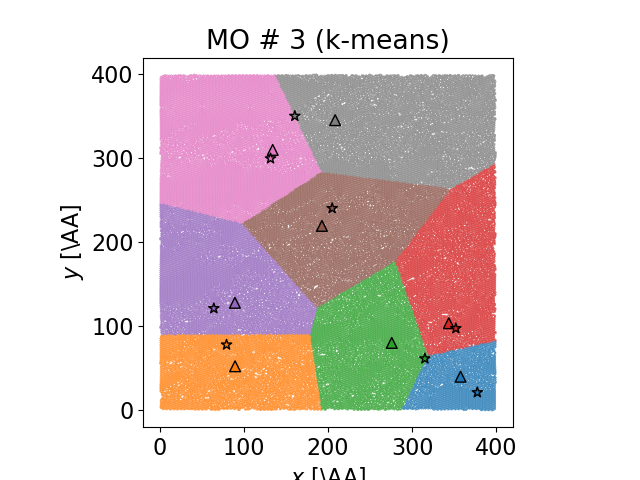

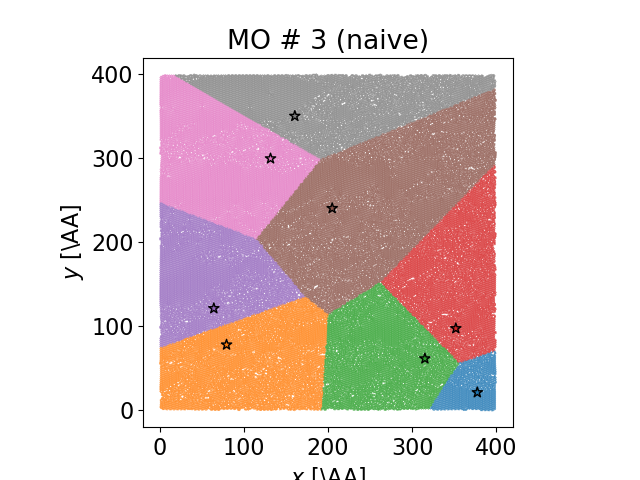

Min inter-site distance =  45.81558778010394
Min inter-cc distance =  65.16717609965481


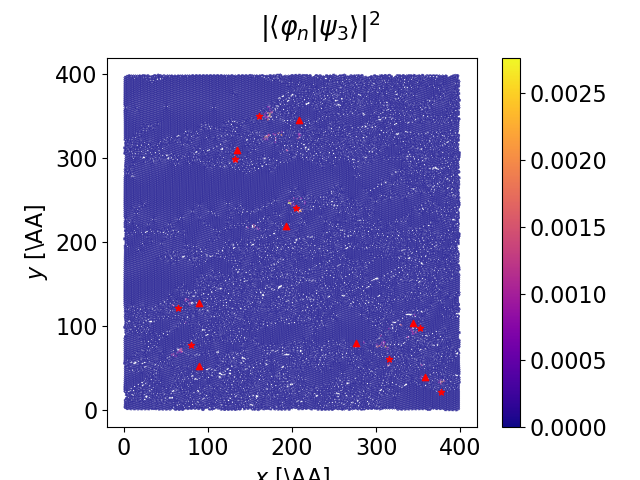

nclusts =  1
cc_clrs =  ['#1f77b4']
cluster_clrs =  ['#1f77b4']


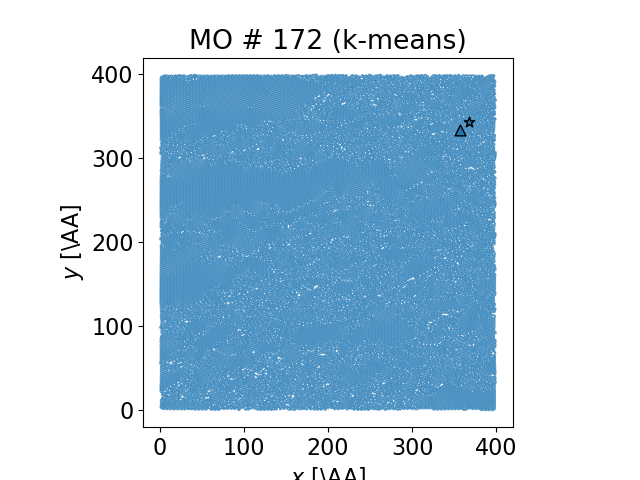

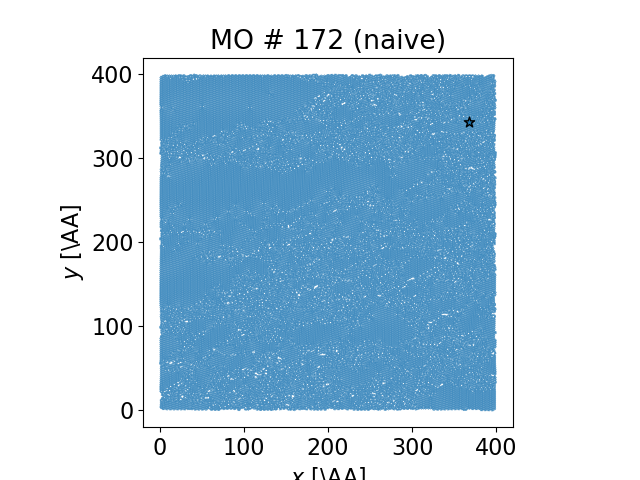

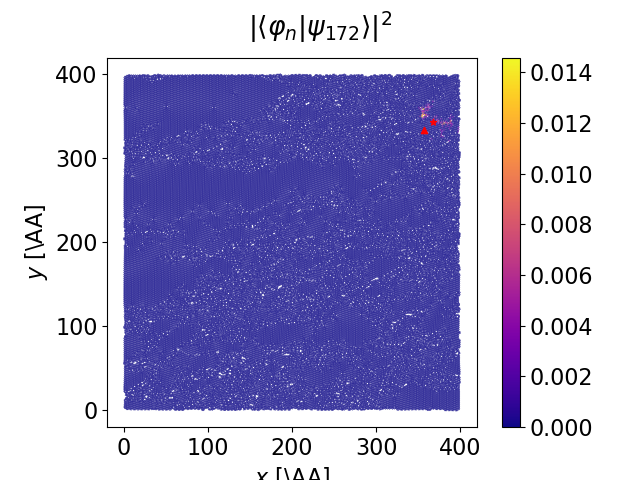

nclusts =  3
cc_clrs =  ['#1f77b4', '#ff7f0e', '#2ca02c']
cluster_clrs =  ['#1f77b4', '#ff7f0e', '#2ca02c']


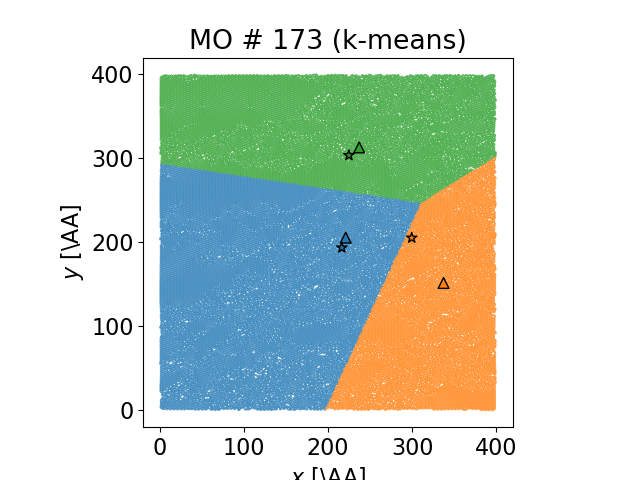

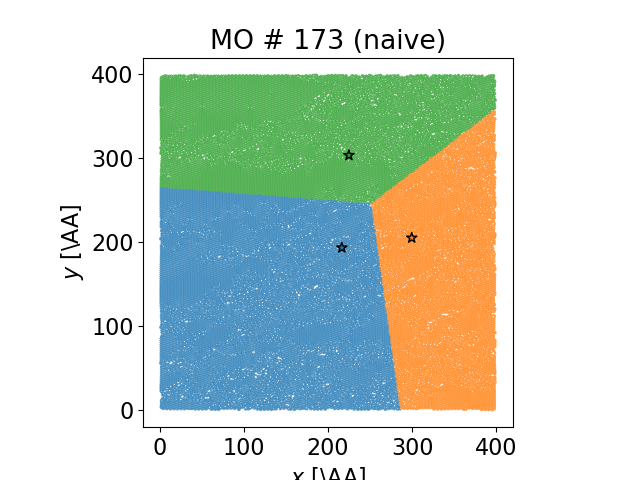

Min inter-site distance =  83.97847293169247
Min inter-cc distance =  108.5570567777876


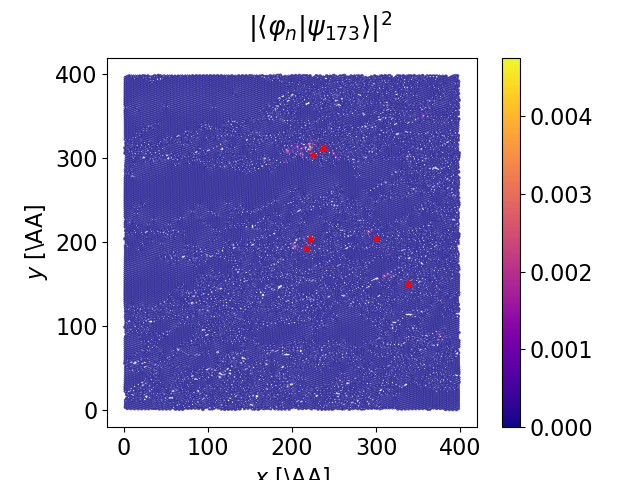

In [3]:
from MOs2sites import assign_AOs,assign_AOs_naive, generate_site_list_opt, LR_MOs, pair_dists_w_inds
from matplotlib import rcParams

cyc = rcParams['axes.prop_cycle'] #default plot colours are stored in this `cycler` type object

pos = pos[:,:2]

gamL = np.load(percdir + f'gamL_40x40-{nsample}_virtual.npy')
gamR = np.load(percdir + f'gamR_40x40-{nsample}_virtual.npy')
energies = np.load(f'/Users/nico/Desktop/simulation_outputs/percolation/Ata_structures/tempdot6/eARPACK/virtual/eARPACK_bigMAC-{nsample}.npy')

L, R = LR_MOs(gamL, gamR)

cc, ee, ii = generate_site_list_opt(pos, M, L, R,energies,threshold_ratio=0.5,shift_centers=True)
MO_inds = np.unique(ii)[MO_inds]

for n in MO_inds:
    site_inds = (ii == n).nonzero()[0]
    nsites  = site_inds.shape[0]
    sites = cc[site_inds]
    colors = [d['color'] for d in list(cyc[0:nsites])]
    psi = M[:,n]
    psi2 = np.abs(psi) ** 2

    cluster_centers,labels = assign_AOs(pos,sites,psi=psi)
    labels2 = assign_AOs_naive(pos,sites)

    if nsites > 1:
        dsites, _ = pair_dists_w_inds(sites)
        dcluster_centers, _= pair_dists_w_inds(cluster_centers)

    atom_clrs  = [colors[k] for k in labels]
    atom_clrs2 = [colors[k] for k in labels2]
    cluster_clrs = colors
    cc_clrs = colors
    
    print('cc_clrs = ',cc_clrs)
    print('cluster_clrs = ',cluster_clrs)
    
    fig,ax = plt.subplots()
    fig, ax = plot_atoms(pos,dotsize=0.1,show=False,plt_objs=(fig,ax),usetex=False,colour=atom_clrs,zorder=1)
    ax.scatter(*cluster_centers.T,marker='^',c=cluster_clrs,edgecolors='k',s=60.0,zorder=2)
    ax.scatter(*sites.T,marker='*',c=cc_clrs,edgecolors='k',s=60.0,zorder=3)
    ax.set_title(f'MO # {n} (k-means)')
    plt.show()
    
    fig,ax = plt.subplots()
    fig, ax = plot_atoms(pos,dotsize=0.1,show=False,plt_objs=(fig,ax),usetex=False,colour=atom_clrs2,zorder=1)
    ax.scatter(*sites.T,marker='*',c=cc_clrs,edgecolors='k',s=60.0,zorder=3)
    ax.set_title(f'MO # {n} (naive)')
    plt.show()

    if nsites > 1:
        print('Min inter-site distance = ', np.min(dsites))
        print('Min inter-cc distance = ', np.min(dcluster_centers))
    
    fig,ax = plt.subplots()

    fig, ax = plot_MO(pos,Mcut,n,dotsize=0.1,show=False,plt_objs=(fig,ax),usetex=False)
    ax.scatter(sites[:,0],sites[:,1],marker='*',color='r',s=20)
    ax.scatter(cluster_centers[:,0],cluster_centers[:,1],marker='^',color='r',s=20)
    # ax.scatter(sites2[:,0],sites2[:,1],marker='o',edgecolors='r',facecolors='none',s=100)
    plt.show()


In [ ]:
from MOs2sites import get_MO_loc_centers_opt

n = 3

sites = get_MO_loc_centers_opt(pos, M, n, nbins=100,threshold_ratio=0.5, shift_centers=False,min_distance=16)
sites2 = get_MO_loc_centers_opt(pos, M, n, nbins=100,threshold_ratio=0.0, shift_centers=False,min_distance=16)

fig, ax = plt.subplots()

fig, ax = plot_MO(pos,M,n,dotsize=0.1,show=False,plt_objs=(fig,ax),usetex=False)
ax.scatter(*sites.T,marker='o',c=None,edgecolors='r',ms=100.0,lw=1.0)
ax.scatter(*sites2.T,marker='*',c='r',ms=50.0)

plt.show()


In [3]:
from scipy.spatial import Voronoi, voronoi_plot_2d
from MOs2sites import assign_AOs, assign_AOs_naive, site_radii

pos = pos[:,:2]

for MO_ind in MO_inds:

    print(f'********** {MO_ind} **********')

    sites, *_ = get_MO_loc_centers_opt(pos, M, MO_ind, nbins=100, threshold_ratio=0.3,shift_centers=True,min_distance=30.0)

    if sites.shape[0] == 2:
        continue

    psi = M[:,MO_ind]
    centers_kmeans, labels_kmeans = assign_AOs(pos, sites, psi)

    labels_naive = assign_AOs_naive(pos,sites)

    sites_kmeans, radii_kmeans = site_radii(pos, M, MO_ind, labels_kmeans)
    sites_kmeans_hl, radii_kmeans_hl = site_radii(pos, M, MO_ind, labels_kmeans, hyperlocal=True)

    # ------ k-means approach -------

    vor = Voronoi(centers_kmeans)

    fig,ax = plt.subplots()
    fig, ax = plot_MO(pos,M,MO_ind,dotsize=0.5,show=False,plt_objs=(fig,ax),usetex=False,scale_up=50,title=f'Partition of $|\psi_{{{MO_ind}}}\\rangle$ (k-means)')
    ax.scatter(*centers_kmeans.T,marker='^',c='r',edgecolors='k',s=60.0,zorder=2,label='cluster centres')
    fig = voronoi_plot_2d(vor, ax, line_color='white', show_vertices=False, show_points=False)
    ax.scatter(*sites_kmeans.T,marker='h',c='r',edgecolors='k',s=60.0,zorder=4,label='final sites')
    ax.scatter(*sites_kmeans_hl.T,marker='h',c='limegreen',edgecolors='k',s=60.0,zorder=4,label='final sites (hyperlocal)')
    for k in range(sites_kmeans.shape[0]): 
        print(sites_kmeans[k,:])
        print(sites_kmeans_hl[k,:])
        loc_circle = plt.Circle(sites_kmeans[k,:], radii_kmeans[k], fc='none', ec='r', ls='--', lw=1.0,zorder=4)
        ax.add_patch(loc_circle)
        loc_circle = plt.Circle(sites_kmeans_hl[k], radii_kmeans_hl[k], fc='none', ec='limegreen', ls='--', lw=1.0,zorder=4)
        ax.add_patch(loc_circle)
    fig = voronoi_plot_2d(vor, ax, line_color='snow', show_vertices=False, show_points=False)
    ax.set_xlim([0,400])
    ax.set_ylim([0,400])
    plt.legend()
    plt.show()


    # ------ Voronoi only: 'naive' approach ------

    vor = Voronoi(sites)
    sites_naive, radii_naive = site_radii(pos, M, MO_ind, labels_naive)
    sites_naive_hl, radii_naive_hl = site_radii(pos, M, MO_ind, labels_naive, hyperlocal=True)

    fig,ax = plt.subplots()
    fig, ax = plot_MO(pos,M,MO_ind,dotsize=0.5,show=False,plt_objs=(fig,ax),usetex=False,scale_up=50,title=f'Partition MO $|\psi_{{{MO_ind}}}\\rangle$ (Voronoi)')
    ax.scatter(*sites.T,marker='*',c='r',edgecolors='k',s=60.0,zorder=3,label='hopping sites')
    fig = voronoi_plot_2d(vor, ax, line_color='snow', show_vertices=False, show_points=False)
    ax.scatter(*sites_naive.T,marker='h',c='r',edgecolors='k',s=60.0,zorder=4,label='final sites')
    ax.scatter(*sites_naive_hl.T,marker='h',c='limegreen',edgecolors='k',s=60.0,zorder=4,label='final sites (hyperlocal)')
    for k in range(sites_naive.shape[0]): 
        loc_circle = plt.Circle(sites_naive[k,:], radii_naive[k], fc='none', ec='r', ls='--', lw=1.0,zorder=4)
        ax.add_patch(loc_circle)
        loc_circle = plt.Circle(sites_naive_hl[k], radii_naive_hl[k], fc='none', ec='limegreen', ls='--', lw=1.0,zorder=4)
        ax.add_patch(loc_circle)
    ax.set_xlim([0,400])
    ax.set_ylim([0,400])
    plt.legend()
    plt.show()


********** 0 **********


<>:28: SyntaxWarning: invalid escape sequence '\p'
<>:54: SyntaxWarning: invalid escape sequence '\p'
<>:28: SyntaxWarning: invalid escape sequence '\p'
<>:54: SyntaxWarning: invalid escape sequence '\p'
/var/folders/gt/qhbvbx5d1hv7mm6w7y4738c40000gn/T/ipykernel_51016/1273579770.py:28: SyntaxWarning: invalid escape sequence '\p'
  fig, ax = plot_MO(pos,M,MO_ind,dotsize=0.5,show=False,plt_objs=(fig,ax),usetex=False,scale_up=50,title=f'Partition of $|\psi_{{{MO_ind}}}\\rangle$ (k-means)')
/var/folders/gt/qhbvbx5d1hv7mm6w7y4738c40000gn/T/ipykernel_51016/1273579770.py:54: SyntaxWarning: invalid escape sequence '\p'
  fig, ax = plot_MO(pos,M,MO_ind,dotsize=0.5,show=False,plt_objs=(fig,ax),usetex=False,scale_up=50,title=f'Partition MO $|\psi_{{{MO_ind}}}\\rangle$ (Voronoi)')
/var/folders/gt/qhbvbx5d1hv7mm6w7y4738c40000gn/T/ipykernel_51016/1273579770.py:28: SyntaxWarning: invalid escape sequence '\p'
  fig, ax = plot_MO(pos,M,MO_ind,dotsize=0.5,show=False,plt_objs=(fig,ax),usetex=False,scale_

NameError: name 'nsites' is not defined